# Домашнее задание  № 5. Матричные разложения/Тематическое моделирование

### Задание № 1 (4 балла)

Попробуйте матричные разложения с 5 классификаторами - SGDClassifier, KNeighborsClassifier,  RandomForest, ExtraTreesClassifier (про него подробнее почитайте в документации, он похож на RF). Используйте и NMF и SVD. Сравните результаты на кросс-валидации и выберите лучшее сочетание.

В итоге у вас должно получиться, как минимум 10 моделей (два разложения на каждый классификатор). Используйте 1 и те же параметры кросс-валидации. Параметры векторизации, параметры K в матричных разложениях, параметры классификаторов могут быть разными между экспериментами.

Можете взять поменьше данных, если все будет обучаться слишком долго (не ставьте параметр K слишком большим в NMF, иначе точно будет слишком долго)

In [2]:
!pip install pyLDAvis 

     |████████████████████████████████| 1.7 MB 573 kB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=34dec3a0b67a4423907a68acce790b780ae042c9189fa5901e9221f952f91a64
  Stored in directory: /Users/AlyaMac/Library/Caches/pip/wheels/90/61/ec/9dbe9efc3acf9c4e37ba70fbbcc3f3a0ebd121060aa593181a
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1316 sha256=193aad0bf3ebcf79a2e8c84fcb7aec8dd97283491732c39bf60aa99d051457cc
  Stored in directory: /Users/AlyaMac/Library/Caches/pip/wheels/22/0b/40/fd3f795caaa1fb4c6cb738bc1f56100be1e57da95849bfc897
Successfully built pyLDAvis sklearn


In [5]:
import gensim
import pandas as pd
import numpy as np
from pymorphy2 import MorphAnalyzer
import pyLDAvis.gensim_models
from collections import Counter
from string import punctuation
from razdel import tokenize as razdel_tokenize
from IPython.display import Image
from IPython.core.display import HTML 
from sklearn.decomposition import TruncatedSVD, NMF, PCA, LatentDirichletAllocation
from sklearn.manifold import TSNE
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, TfidfTransformer
from sklearn.metrics.pairwise import cosine_distances
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, StratifiedKFold
import warnings
from matplotlib import pyplot as plt
import seaborn as sns
morph = MorphAnalyzer()
warnings.filterwarnings("ignore")

/Users/AlyaMac/opt/anaconda3/lib/python3.8/site-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
/Users/AlyaMac/opt/anaconda3/lib/python3.8/site-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
/Users/AlyaMac/opt/anaconda3/lib/python3.8/site-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, kw, default = inspect.getargspec(cls.__init__)
/Users/AlyaMac/opt/anaconda3/lib/python3.8/site-packages/pymorphy2/units/base.py:70: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signatur

In [2]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import ExtraTreesClassifier

In [3]:
data = pd.read_csv('avito_category_classification.csv')

In [4]:
data.head()

,category_name,description
0,Автомобили,"отличное состояние,обслужиание в салоне"
1,Детская одежда и обувь,В отличном состоянии. Фирма KIKO. Очень теплый...
2,Предложение услуг,"Изготовление ограждений, перил,качелей, турник..."
3,Автомобили,Автомобиль в отличном техническом состоянии. О...
4,Бытовая техника,"Продается газовая плита ""Гефест"" (Белоруссия) ..."


In [5]:
def normalize(text):
    normalized_text = [word.text.strip(punctuation) for word \
                                                            in razdel_tokenize(text)]
    normalized_text = [word.lower() for word in normalized_text if word and len(word) < 20 ]
    normalized_text = [morph.parse(word)[0].normal_form for word in normalized_text]
    return ' '.join(normalized_text)

In [6]:
data['description_norm'] = data['description'].apply(normalize)

In [7]:
cv = CountVectorizer(tokenizer=lambda x: x.split(), min_df=5, max_df=0.1)
svd = TruncatedSVD(500)

In [8]:
X_sparse = cv.fit_transform(data['description_norm'])
X = svd.fit_transform(X_sparse)

In [9]:
X_sparse.shape

(9898, 4468)

In [10]:
X.shape

(9898, 500)

In [11]:
sum(svd.explained_variance_ratio_)

0.7900988792276473

# 1. SGDClassifier

## SVD

In [13]:
pipeline_bow_sgd = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('clf', SGDClassifier(max_iter=1000))
])

pipeline_svd_sgd = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('svd', TruncatedSVD(500)),
    ('clf', SGDClassifier(max_iter=1000))
])

In [14]:
# кросс-валидация
def eval_table(X, y, pipeline, N=6):
    labels = list(set(y))
    
    fold_metrics = pd.DataFrame(index=labels)
    errors = np.zeros((len(labels), len(labels)))
    
    kfold = StratifiedKFold(n_splits=N, shuffle=True, )
    
    for i, (train_index, test_index) in enumerate(kfold.split(X, y)):
        pipeline.fit(X[train_index], y[train_index])
        preds = pipeline.predict(X[test_index])
        
        fold_metrics[f'precision_{i}'] = precision_score(y[test_index], preds, labels=labels, average=None)
        fold_metrics[f'recall_{i}'] = recall_score(y[test_index], preds, labels=labels, average=None)
        fold_metrics[f'f1_{i}'] = f1_score(y[test_index], preds, labels=labels, average=None)
        errors += confusion_matrix(y[test_index], preds, labels=labels, normalize='true')
    
    result = pd.DataFrame(index=labels)
    result['precision'] = fold_metrics[[f'precision_{i}' for i in range(N)]].mean(axis=1).round(2)
    result['precision_std'] = fold_metrics[[f'precision_{i}' for i in range(N)]].std(axis=1).round(2)
    
    result['recall'] = fold_metrics[[f'recall_{i}' for i in range(N)]].mean(axis=1).round(2)
    result['recall_std'] = fold_metrics[[f'recall_{i}' for i in range(N)]].std(axis=1).round(2)
    
    result['f1'] = fold_metrics[[f'f1_{i}' for i in range(N)]].mean(axis=1).round(2)
    result['f1_std'] = fold_metrics[[f'f1_{i}' for i in range(N)]].std(axis=1).round(2)
    
    result.loc['mean'] = result.mean().round(2)
    errors /= N
    
    return result, errors

In [15]:
metrics_bow_sgd, errors_bow_sgd = eval_table(data['description_norm'], data['category_name'], pipeline_bow_sgd)
metrics_svd_sgd, errors_svd_sgd = eval_table(data['description_norm'], data['category_name'], pipeline_svd_sgd)

In [16]:
metrics_bow_sgd

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.73,0.04,0.63,0.02,0.67,0.02
Товары для детей и игрушки,0.78,0.03,0.69,0.03,0.73,0.02
Бытовая техника,0.74,0.06,0.56,0.09,0.63,0.06
Автомобили,0.90,0.02,0.86,0.04,0.88,0.02
Детская одежда и обувь,0.73,0.02,0.80,0.02,0.76,0.01
"Одежда, обувь, аксессуары",0.69,0.02,0.79,0.04,0.74,0.03
Квартиры,0.98,0.01,0.95,0.02,0.96,0.01
Телефоны,0.88,0.03,0.78,0.03,0.83,0.02
Предложение услуг,0.85,0.03,0.75,0.05,0.79,0.03
Ремонт и строительство,0.68,0.04,0.52,0.05,0.59,0.04


In [19]:
metrics_bow_sgd['precision'].mean()

0.7963636363636364

In [28]:
metrics_bow_sgd['f1'].mean()

0.7581818181818182

In [21]:
metrics_svd_sgd

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.70,0.08,0.65,0.06,0.67,0.04
Товары для детей и игрушки,0.75,0.08,0.63,0.03,0.68,0.03
Бытовая техника,0.68,0.05,0.49,0.08,0.56,0.05
Автомобили,0.85,0.04,0.89,0.04,0.87,0.02
Детская одежда и обувь,0.74,0.04,0.79,0.03,0.76,0.02
"Одежда, обувь, аксессуары",0.73,0.03,0.77,0.05,0.75,0.03
Квартиры,0.96,0.02,0.96,0.02,0.96,0.01
Телефоны,0.82,0.04,0.79,0.05,0.80,0.03
Предложение услуг,0.75,0.05,0.76,0.03,0.76,0.03
Ремонт и строительство,0.60,0.12,0.51,0.03,0.55,0.04


In [22]:
metrics_svd_sgd['precision'].mean()

0.7581818181818182

In [29]:
metrics_svd_sgd['f1'].mean()

0.7363636363636363

In [74]:
metrics_svd_sgd['recall'].mean()

0.7236363636363636

In [23]:
metrics_svd_sgd - metrics_bow_sgd 

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,-0.03,0.04,0.02,0.04,0.00,0.02
Товары для детей и игрушки,-0.03,0.05,-0.06,0.00,-0.05,0.01
Бытовая техника,-0.06,-0.01,-0.07,-0.01,-0.07,-0.01
Автомобили,-0.05,0.02,0.03,0.00,-0.01,0.00
Детская одежда и обувь,0.01,0.02,-0.01,0.01,0.00,0.01
"Одежда, обувь, аксессуары",0.04,0.01,-0.02,0.01,0.01,0.00
Квартиры,-0.02,0.01,0.01,0.00,0.00,0.00
Телефоны,-0.06,0.01,0.01,0.02,-0.03,0.01
Предложение услуг,-0.10,0.02,0.01,-0.02,-0.03,0.00
Ремонт и строительство,-0.08,0.08,-0.01,-0.02,-0.04,0.00


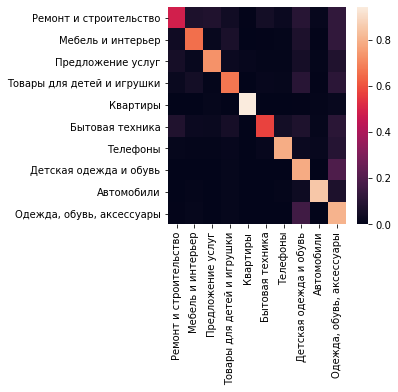

In [53]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_bow_sgd, xticklabels=metrics_bow_sgd.index.tolist()[:-1], 
            yticklabels=metrics_bow_sgd.index.tolist()[:-1])
plt.show()

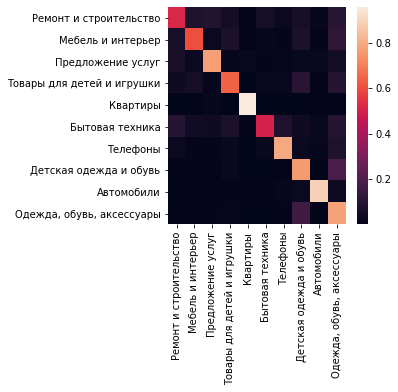

In [56]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_svd_sgd, xticklabels=metrics_svd_sgd.index.tolist()[:-1], 
            yticklabels=metrics_svd_sgd.index.tolist()[:-1])
plt.show()

## NMF

In [24]:
pipeline_nmf_sgd = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), min_df=3, max_df=0.3)),
    ('tfidf', TfidfTransformer()),
    ('decomposition', NMF(100)),
    ('clf', SGDClassifier(max_iter=1000))
])

In [25]:
metrics_nmf_sgd, errors_nmf_sgd = eval_table(data['description_norm'], data['category_name'], pipeline_nmf_sgd)

In [26]:
metrics_nmf_sgd

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.70,0.19,0.19,0.11,0.29,0.15
Товары для детей и игрушки,0.85,0.14,0.30,0.12,0.43,0.09
Бытовая техника,0.33,0.36,0.07,0.08,0.10,0.09
Автомобили,0.71,0.17,0.74,0.13,0.70,0.07
Детская одежда и обувь,0.60,0.16,0.67,0.13,0.61,0.07
"Одежда, обувь, аксессуары",0.62,0.12,0.71,0.12,0.64,0.04
Квартиры,0.70,0.18,0.93,0.06,0.78,0.12
Телефоны,0.73,0.19,0.54,0.22,0.57,0.15
Предложение услуг,0.78,0.20,0.17,0.17,0.24,0.20
Ремонт и строительство,0.23,0.06,0.24,0.30,0.14,0.12


In [27]:
metrics_nmf_sgd['precision'].mean()

0.6254545454545455

In [30]:
metrics_nmf_sgd['f1'].mean()

0.45

In [75]:
metrics_nmf_sgd['recall'].mean()

0.4563636363636364

In [60]:
metrics_nmf_sgd - metrics_bow_sgd

,precision,precision_std,recall,recall_std,f1,f1_std
Ремонт и строительство,-0.60,0.14,-0.46,0.03,-0.52,0.07
Мебель и интерьер,0.00,0.11,-0.39,0.07,-0.30,0.06
Предложение услуг,-0.08,0.07,-0.58,0.04,-0.53,0.10
Товары для детей и игрушки,-0.06,0.32,-0.26,0.24,-0.34,0.05
Квартиры,-0.22,0.10,0.01,-0.01,-0.12,0.05
Бытовая техника,-0.38,0.24,-0.48,0.06,-0.56,-0.01
Телефоны,-0.15,0.16,-0.21,0.12,-0.21,0.03
Детская одежда и обувь,-0.12,0.20,-0.19,0.09,-0.19,0.05
Автомобили,-0.16,0.06,-0.22,0.17,-0.22,0.14
"Одежда, обувь, аксессуары",-0.12,0.07,-0.04,0.09,-0.10,0.01


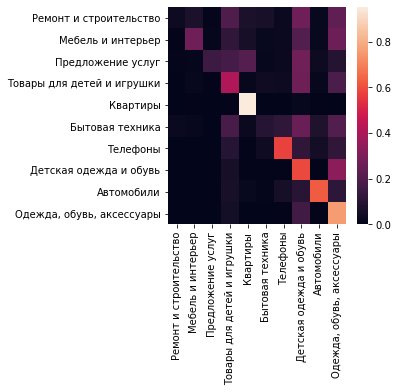

In [62]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_nmf_sgd, xticklabels=metrics_nmf_sgd.index.tolist()[:-1], 
            yticklabels=metrics_nmf_sgd.index.tolist()[:-1])
plt.show()

# 2. KNeighborsClassifier

## SVD

In [31]:
pipeline_bow_knn = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('clf', KNeighborsClassifier(n_neighbors=10))
])

pipeline_svd_knn = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('svd', TruncatedSVD(500)),
    ('clf', KNeighborsClassifier(n_neighbors=10))
])

In [32]:
metrics_bow_knn, errors_bow_knn = eval_table(data['description_norm'], data['category_name'], pipeline_bow_knn)
metrics_svd_knn, errors_svd_knn = eval_table(data['description_norm'], data['category_name'], pipeline_svd_knn)

In [33]:
metrics_bow_knn

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.36,0.07,0.15,0.03,0.21,0.04
Товары для детей и игрушки,0.44,0.07,0.18,0.02,0.26,0.03
Бытовая техника,0.44,0.13,0.19,0.07,0.26,0.09
Автомобили,0.37,0.07,0.45,0.05,0.40,0.04
Детская одежда и обувь,0.38,0.02,0.62,0.01,0.47,0.02
"Одежда, обувь, аксессуары",0.43,0.02,0.55,0.04,0.48,0.03
Квартиры,0.95,0.02,0.48,0.06,0.64,0.05
Телефоны,0.63,0.17,0.21,0.07,0.32,0.10
Предложение услуг,0.65,0.03,0.39,0.05,0.48,0.04
Ремонт и строительство,0.33,0.14,0.16,0.03,0.21,0.02


In [34]:
metrics_bow_knn['precision'].mean()

0.4981818181818182

In [36]:
metrics_bow_knn['f1'].mean()

0.3727272727272727

In [76]:
metrics_bow_knn['recall'].mean()

0.33818181818181814

In [67]:
metrics_svd_knn

,precision,precision_std,recall,recall_std,f1,f1_std
Ремонт и строительство,0.31,0.06,0.17,0.01,0.22,0.02
Мебель и интерьер,0.39,0.07,0.22,0.06,0.28,0.06
Предложение услуг,0.56,0.02,0.60,0.05,0.58,0.03
Товары для детей и игрушки,0.58,0.06,0.23,0.04,0.33,0.04
Квартиры,0.96,0.01,0.70,0.05,0.81,0.03
Бытовая техника,0.39,0.08,0.23,0.06,0.29,0.07
Телефоны,0.73,0.05,0.29,0.07,0.41,0.07
Детская одежда и обувь,0.46,0.01,0.64,0.02,0.53,0.01
Автомобили,0.58,0.02,0.56,0.05,0.57,0.02
"Одежда, обувь, аксессуары",0.46,0.02,0.61,0.03,0.52,0.02


In [35]:
metrics_svd_knn['precision'].mean()

0.5509090909090909

In [37]:
metrics_svd_knn['f1'].mean()

0.46181818181818174

In [77]:
metrics_svd_knn['recall'].mean()

0.4290909090909091

In [38]:
metrics_svd_knn - metrics_bow_knn

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.04,0.01,0.08,0.02,0.08,0.02
Товары для детей и игрушки,0.13,-0.03,0.06,-0.01,0.08,-0.01
Бытовая техника,-0.04,-0.05,0.06,-0.01,0.05,-0.03
Автомобили,0.23,-0.03,0.12,0.00,0.19,-0.01
Детская одежда и обувь,0.09,-0.01,0.02,0.02,0.07,0.00
"Одежда, обувь, аксессуары",0.04,-0.01,0.07,-0.01,0.05,-0.01
Квартиры,0.01,-0.01,0.22,-0.02,0.17,-0.02
Телефоны,0.13,-0.07,0.08,-0.04,0.10,-0.05
Предложение услуг,-0.07,0.00,0.20,-0.02,0.10,-0.03
Ремонт и строительство,-0.03,-0.07,0.00,0.01,0.00,0.02


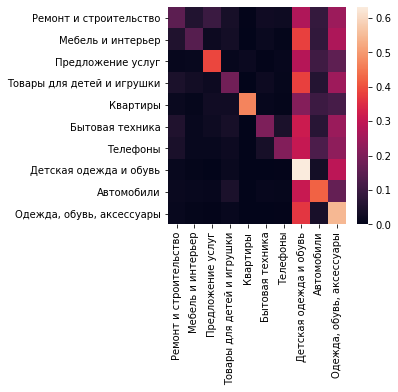

In [69]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_bow_knn, xticklabels=metrics_bow_knn.index.tolist()[:-1], 
            yticklabels=metrics_bow_knn.index.tolist()[:-1])
plt.show()

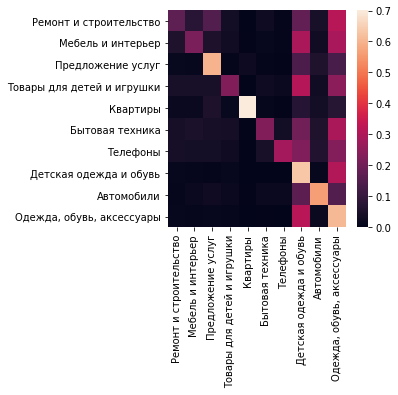

In [70]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_svd_knn, xticklabels=metrics_svd_knn.index.tolist()[:-1], 
            yticklabels=metrics_svd_knn.index.tolist()[:-1])
plt.show()

## NMF

In [39]:
pipeline_nmf_knn = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), min_df=3, max_df=0.3)),
    ('tfidf', TfidfTransformer()),
    ('decomposition', NMF(100)),
    ('clf', KNeighborsClassifier(n_neighbors=10))
])

In [40]:
metrics_nmf_knn, errors_nmf_knn = eval_table(data['description_norm'], data['category_name'], pipeline_nmf_knn)

In [41]:
metrics_nmf_knn

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.40,0.04,0.25,0.03,0.31,0.03
Товары для детей и игрушки,0.45,0.09,0.33,0.04,0.38,0.05
Бытовая техника,0.23,0.04,0.22,0.04,0.22,0.03
Автомобили,0.56,0.07,0.67,0.03,0.61,0.03
Детская одежда и обувь,0.56,0.02,0.55,0.03,0.55,0.02
"Одежда, обувь, аксессуары",0.54,0.03,0.58,0.02,0.56,0.02
Квартиры,0.88,0.07,0.85,0.02,0.86,0.04
Телефоны,0.67,0.07,0.41,0.07,0.50,0.05
Предложение услуг,0.42,0.02,0.74,0.06,0.54,0.03
Ремонт и строительство,0.24,0.04,0.22,0.05,0.23,0.04


In [78]:
metrics_nmf_knn['precision'].mean()

0.4954545454545455

In [79]:
metrics_nmf_knn['f1'].mean()

0.4763636363636364

In [80]:
metrics_nmf_knn['recall'].mean()

0.48181818181818187

In [73]:
metrics_nmf_knn - metrics_bow_knn

,precision,precision_std,recall,recall_std,f1,f1_std
Ремонт и строительство,-0.02,-0.04,0.08,-0.01,0.06,-0.01
Мебель и интерьер,0.07,0.01,0.14,0.01,0.14,0.00
Предложение услуг,-0.19,-0.01,0.33,-0.02,0.07,0.00
Товары для детей и игрушки,0.02,-0.02,0.18,0.01,0.14,0.00
Квартиры,-0.10,0.03,0.35,0.01,0.21,0.01
Бытовая техника,-0.16,-0.05,0.06,-0.02,-0.01,-0.04
Телефоны,0.02,-0.02,0.26,0.02,0.23,0.00
Детская одежда и обувь,0.17,0.01,-0.08,0.02,0.07,0.03
Автомобили,0.22,-0.01,0.27,-0.01,0.24,0.00
"Одежда, обувь, аксессуары",0.09,0.00,0.01,-0.02,0.05,-0.01


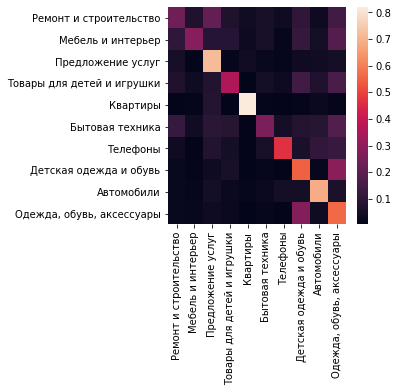

In [74]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_nmf_knn, xticklabels=metrics_nmf_knn.index.tolist()[:-1], 
            yticklabels=metrics_nmf_knn.index.tolist()[:-1])
plt.show()

# 3. RandomForest

## SVD

In [44]:
pipeline_bow_rf = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('clf', RandomForestClassifier(n_estimators=100, max_depth=10))
])

pipeline_svd_rf = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('svd', TruncatedSVD(500)),
    ('clf', RandomForestClassifier(n_estimators=100, max_depth=10))
])

In [45]:
metrics_bow_rf, errors_bow_rf = eval_table(data['description_norm'], data['category_name'], pipeline_bow_rf)
metrics_svd_rf, errors_svd_rf = eval_table(data['description_norm'], data['category_name'], pipeline_svd_rf)

In [46]:
metrics_bow_rf

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.58,0.49,0.01,0.01,0.02,0.01
Товары для детей и игрушки,0.99,0.02,0.16,0.02,0.27,0.03
Бытовая техника,0.17,0.41,0.00,0.01,0.01,0.02
Автомобили,0.99,0.01,0.49,0.05,0.66,0.04
Детская одежда и обувь,0.63,0.03,0.57,0.05,0.60,0.02
"Одежда, обувь, аксессуары",0.35,0.01,0.90,0.02,0.50,0.01
Квартиры,0.95,0.01,0.85,0.04,0.90,0.02
Телефоны,1.00,0.00,0.26,0.05,0.40,0.07
Предложение услуг,0.92,0.14,0.05,0.01,0.09,0.03
Ремонт и строительство,1.00,0.00,0.02,0.01,0.05,0.02


In [47]:
metrics_bow_rf['precision'].mean()

0.7581818181818182

In [51]:
metrics_bow_rf['f1'].mean()

0.35

In [48]:
metrics_svd_rf

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.92,0.13,0.04,0.01,0.07,0.02
Товары для детей и игрушки,0.82,0.03,0.19,0.06,0.30,0.08
Бытовая техника,0.92,0.12,0.06,0.03,0.11,0.06
Автомобили,0.86,0.05,0.58,0.05,0.69,0.04
Детская одежда и обувь,0.45,0.03,0.68,0.03,0.54,0.03
"Одежда, обувь, аксессуары",0.47,0.02,0.76,0.02,0.58,0.02
Квартиры,0.85,0.02,0.90,0.04,0.87,0.02
Телефоны,0.96,0.02,0.33,0.04,0.49,0.05
Предложение услуг,0.76,0.04,0.49,0.04,0.59,0.03
Ремонт и строительство,0.80,0.14,0.10,0.03,0.18,0.05


In [49]:
metrics_svd_rf['precision'].mean()

0.7809090909090909

In [50]:
metrics_svd_rf['f1'].mean()

0.44181818181818183

In [81]:
metrics_svd_rf['recall'].mean()

0.4127272727272727

In [52]:
metrics_svd_rf - metrics_bow_rf

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.34,-0.36,0.03,0.00,0.05,0.01
Товары для детей и игрушки,-0.17,0.01,0.03,0.04,0.03,0.05
Бытовая техника,0.75,-0.29,0.06,0.02,0.10,0.04
Автомобили,-0.13,0.04,0.09,0.00,0.03,0.00
Детская одежда и обувь,-0.18,0.00,0.11,-0.02,-0.06,0.01
"Одежда, обувь, аксессуары",0.12,0.01,-0.14,0.00,0.08,0.01
Квартиры,-0.10,0.01,0.05,0.00,-0.03,0.00
Телефоны,-0.04,0.02,0.07,-0.01,0.09,-0.02
Предложение услуг,-0.16,-0.10,0.44,0.03,0.50,0.00
Ремонт и строительство,-0.20,0.14,0.08,0.02,0.13,0.03


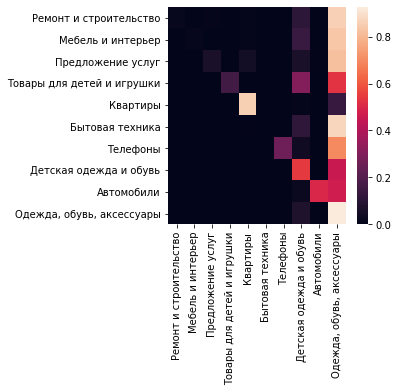

In [81]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_bow_rf, xticklabels=metrics_bow_rf.index.tolist()[:-1], 
            yticklabels=metrics_bow_rf.index.tolist()[:-1])
plt.show()

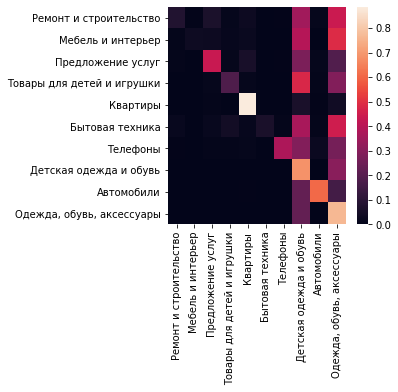

In [82]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_svd_rf, xticklabels=metrics_svd_rf.index.tolist()[:-1], 
            yticklabels=metrics_svd_rf.index.tolist()[:-1])
plt.show()

## NMF

In [53]:
pipeline_nmf_rf = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), min_df=3, max_df=0.3)),
    ('tfidf', TfidfTransformer()),
    ('decomposition', NMF(100)),
    ('clf', RandomForestClassifier(n_estimators=200, max_depth=6))
])

In [54]:
metrics_nmf_rf, errors_nmf_rf = eval_table(data['description_norm'], data['category_name'], pipeline_nmf_rf)

In [55]:
metrics_nmf_rf

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.78,0.09,0.18,0.06,0.28,0.09
Товары для детей и игрушки,0.89,0.06,0.32,0.06,0.47,0.07
Бытовая техника,0.67,0.52,0.01,0.01,0.03,0.02
Автомобили,0.90,0.02,0.76,0.05,0.82,0.03
Детская одежда и обувь,0.64,0.09,0.71,0.04,0.66,0.04
"Одежда, обувь, аксессуары",0.46,0.07,0.82,0.07,0.58,0.03
Квартиры,0.88,0.02,0.95,0.02,0.91,0.01
Телефоны,0.89,0.08,0.40,0.12,0.54,0.09
Предложение услуг,0.69,0.03,0.49,0.05,0.57,0.03
Ремонт и строительство,0.67,0.07,0.04,0.02,0.08,0.03


In [56]:
metrics_nmf_rf['precision'].mean()

0.7472727272727272

In [57]:
metrics_nmf_rf['f1'].mean()

0.49363636363636376

In [82]:
metrics_nmf_rf['recall'].mean()

0.4681818181818182

In [58]:
metrics_nmf_rf - metrics_bow_rf

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.20,-0.40,0.17,0.05,0.26,0.08
Товары для детей и игрушки,-0.10,0.04,0.16,0.04,0.20,0.04
Бытовая техника,0.50,0.11,0.01,0.00,0.02,0.00
Автомобили,-0.09,0.01,0.27,0.00,0.16,-0.01
Детская одежда и обувь,0.01,0.06,0.14,-0.01,0.06,0.02
"Одежда, обувь, аксессуары",0.11,0.06,-0.08,0.05,0.08,0.02
Квартиры,-0.07,0.01,0.10,-0.02,0.01,-0.01
Телефоны,-0.11,0.08,0.14,0.07,0.14,0.02
Предложение услуг,-0.23,-0.11,0.44,0.04,0.48,0.00
Ремонт и строительство,-0.33,0.07,0.02,0.01,0.03,0.01


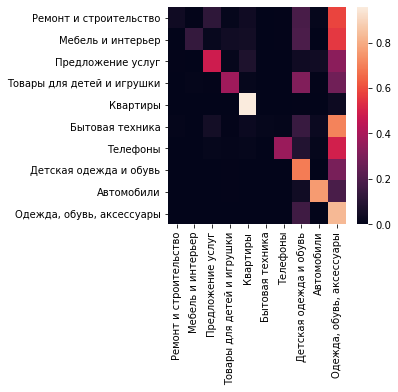

In [87]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_nmf_rf, xticklabels=metrics_nmf_rf.index.tolist()[:-1], 
            yticklabels=metrics_nmf_rf.index.tolist()[:-1])
plt.show()

# 4. ExtraTreesClassifier

## SVD

In [59]:
pipeline_bow_etc = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('clf', ExtraTreesClassifier(n_estimators=100))
])

pipeline_svd_etc = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), ngram_range=(1,2), min_df=5, max_df=0.4)),
    ('svd', TruncatedSVD(500)),
    ('clf', ExtraTreesClassifier(n_estimators=100))
])

In [60]:
metrics_bow_etc, errors_bow_etc = eval_table(data['description_norm'], data['category_name'], pipeline_bow_etc)
metrics_svd_etc, errors_svd_etc = eval_table(data['description_norm'], data['category_name'], pipeline_svd_etc)

In [61]:
metrics_bow_etc

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.70,0.03,0.58,0.06,0.63,0.04
Товары для детей и игрушки,0.71,0.02,0.58,0.04,0.64,0.03
Бытовая техника,0.54,0.02,0.46,0.09,0.49,0.05
Автомобили,0.83,0.03,0.88,0.02,0.86,0.03
Детская одежда и обувь,0.71,0.01,0.78,0.01,0.74,0.01
"Одежда, обувь, аксессуары",0.70,0.02,0.77,0.02,0.73,0.02
Квартиры,0.95,0.02,0.97,0.02,0.96,0.01
Телефоны,0.80,0.04,0.76,0.05,0.78,0.04
Предложение услуг,0.75,0.05,0.76,0.04,0.75,0.04
Ремонт и строительство,0.62,0.04,0.41,0.03,0.49,0.02


In [62]:
metrics_bow_etc['precision'].mean()

0.7309090909090908

In [83]:
metrics_bow_etc['f1'].mean()

0.7072727272727273

In [63]:
metrics_svd_etc

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.79,0.11,0.13,0.03,0.22,0.05
Товары для детей и игрушки,0.68,0.10,0.16,0.04,0.26,0.06
Бытовая техника,0.53,0.08,0.13,0.02,0.20,0.04
Автомобили,0.80,0.07,0.45,0.08,0.58,0.08
Детская одежда и обувь,0.43,0.02,0.71,0.03,0.54,0.01
"Одежда, обувь, аксессуары",0.46,0.02,0.71,0.04,0.56,0.02
Квартиры,0.72,0.04,0.79,0.04,0.75,0.02
Телефоны,0.87,0.03,0.33,0.03,0.48,0.04
Предложение услуг,0.86,0.08,0.28,0.09,0.42,0.10
Ремонт и строительство,0.63,0.13,0.09,0.04,0.15,0.07


In [64]:
metrics_svd_etc['precision'].mean()

0.6772727272727272

In [65]:
metrics_svd_etc['f1'].mean()

0.4163636363636364

In [84]:
metrics_svd_etc['recall'].mean()

0.3781818181818182

In [66]:
metrics_svd_etc - metrics_bow_etc

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.09,0.08,-0.45,-0.03,-0.41,0.01
Товары для детей и игрушки,-0.03,0.08,-0.42,0.00,-0.38,0.03
Бытовая техника,-0.01,0.06,-0.33,-0.07,-0.29,-0.01
Автомобили,-0.03,0.04,-0.43,0.06,-0.28,0.05
Детская одежда и обувь,-0.28,0.01,-0.07,0.02,-0.20,0.00
"Одежда, обувь, аксессуары",-0.24,0.00,-0.06,0.02,-0.17,0.00
Квартиры,-0.23,0.02,-0.18,0.02,-0.21,0.01
Телефоны,0.07,-0.01,-0.43,-0.02,-0.30,0.00
Предложение услуг,0.11,0.03,-0.48,0.05,-0.33,0.06
Ремонт и строительство,0.01,0.09,-0.32,0.01,-0.34,0.05


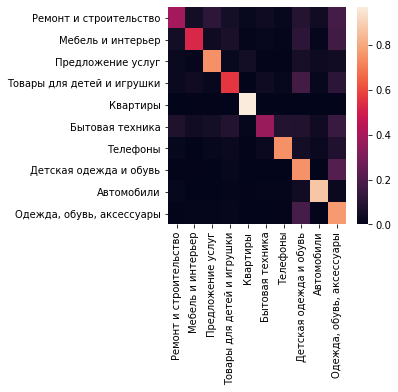

In [94]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_bow_etc, xticklabels=metrics_bow_etc.index.tolist()[:-1], 
            yticklabels=metrics_bow_etc.index.tolist()[:-1])
plt.show()

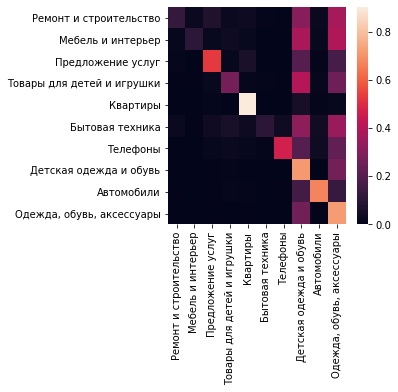

In [95]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_svd_etc, xticklabels=metrics_svd_etc.index.tolist()[:-1], 
            yticklabels=metrics_svd_etc.index.tolist()[:-1])
plt.show()

## NMF

In [67]:
pipeline_nmf_etc = Pipeline([
    ('bow', CountVectorizer(tokenizer=lambda x: x.split(), min_df=3, max_df=0.3)),
    ('tfidf', TfidfTransformer()),
    ('decomposition', NMF(100)),
    ('clf', ExtraTreesClassifier(n_estimators=200))
])

In [68]:
metrics_nmf_etc, errors_nmf_etc = eval_table(data['description_norm'], data['category_name'], pipeline_nmf_etc)

In [69]:
metrics_nmf_etc

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.74,0.03,0.57,0.02,0.64,0.01
Товары для детей и игрушки,0.75,0.01,0.60,0.05,0.67,0.03
Бытовая техника,0.67,0.08,0.33,0.03,0.44,0.04
Автомобили,0.86,0.03,0.91,0.03,0.88,0.03
Детская одежда и обувь,0.75,0.02,0.77,0.02,0.76,0.01
"Одежда, обувь, аксессуары",0.69,0.01,0.81,0.03,0.74,0.02
Квартиры,0.91,0.03,0.97,0.01,0.94,0.02
Телефоны,0.79,0.04,0.80,0.03,0.80,0.03
Предложение услуг,0.72,0.02,0.74,0.07,0.73,0.03
Ремонт и строительство,0.61,0.05,0.48,0.03,0.54,0.03


In [70]:
metrics_nmf_etc['precision'].mean()

0.7490909090909091

In [71]:
metrics_nmf_etc['f1'].mean()

0.7136363636363636

In [85]:
metrics_nmf_etc['recall'].mean()

0.6981818181818182

In [72]:
metrics_nmf_etc - metrics_bow_etc

,precision,precision_std,recall,recall_std,f1,f1_std
Мебель и интерьер,0.04,0.00,-0.01,-0.04,0.01,-0.03
Товары для детей и игрушки,0.04,-0.01,0.02,0.01,0.03,0.00
Бытовая техника,0.13,0.06,-0.13,-0.06,-0.05,-0.01
Автомобили,0.03,0.00,0.03,0.01,0.02,0.00
Детская одежда и обувь,0.04,0.01,-0.01,0.01,0.02,0.00
"Одежда, обувь, аксессуары",-0.01,-0.01,0.04,0.01,0.01,0.00
Квартиры,-0.04,0.01,0.00,-0.01,-0.02,0.01
Телефоны,-0.01,0.00,0.04,-0.02,0.02,-0.01
Предложение услуг,-0.03,-0.03,-0.02,0.03,-0.02,-0.01
Ремонт и строительство,-0.01,0.01,0.07,0.00,0.05,0.01


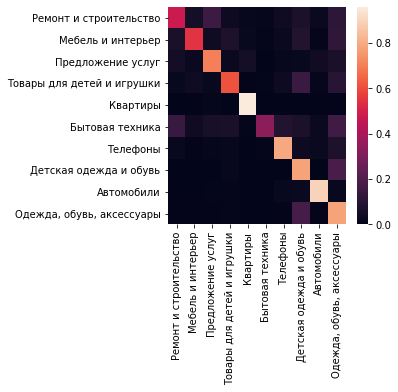

In [100]:
plt.figure(figsize=(4, 4))
sns.heatmap(errors_nmf_etc, xticklabels=metrics_nmf_etc.index.tolist()[:-1], 
            yticklabels=metrics_nmf_etc.index.tolist()[:-1])
plt.show()

## Comparison

In [1]:
import pandas as pd

In [2]:
data = {
    'SVD_SGD': [0.7582, 0.7364, 0.7236], 
    'SVD_KNN': [0.4982, 0.3727, 0.3382],
    'SVD_RF': [0.7809, 0.4418, 0.4127],
    'SVD_ETC': [0.6773, 0.4164, 0.3782],
    'NMF_SGD': [0.6255, 0.45, 0.4564],
    'NMF_KNN': [0.4955, 0.4764, 0.4818],
    'NMF_RF': [0.7473, 0.4936, 0.4682],
    'NMF_ETC': [0.7491, 0.7136, 0.6982]
}

In [3]:
compar = pd.DataFrame(data, index=['Precision', 'F1', 'Recall'])

compar

,SVD_SGD,SVD_KNN,SVD_RF,SVD_ETC,NMF_SGD,NMF_KNN,NMF_RF,NMF_ETC
Precision,0.7582,0.4982,0.7809,0.6773,0.6255,0.4955,0.7473,0.7491
F1,0.7364,0.3727,0.4418,0.4164,0.4500,0.4764,0.4936,0.7136
Recall,0.7236,0.3382,0.4127,0.3782,0.4564,0.4818,0.4682,0.6982


Итак, если смотреть на все параметры, то комбинация SVD_SGD дает лучшие результаты по сравнению с остальными. На втором месте будет NMF_ETC. Можно выделить "победителей" и по отдельным параметрам: например, precision лучше у SVD_RF, а F1 и Recall у SVD_SGD.

# Задание № 2 (6 баллов)

В Gensim тоже можно добавить нграммы и tfidf. Постройте 1 модель без них (как в семинаре) и еще 3 модели (1 с нграммами, 1 с tfidf и 1 с нграммами и с tfidf). Сранивте качество с помощью метрик (перплексия, когерентность) и на глаз. Определите лучшую модель. Для каждой модели выберите 1 самую красивую на ваш взгляд тему.

Используйте данные википедии из семинара. Можете взять поменьше данных, если все обучается долго.

Важное требование - получившиеся модели не должны быть совсем плохими. Если хороших тем не получается, попробуйте настроить гиперпараметры, отфильтровать словарь по-другому. 

In [7]:
texts = open('wiki_data.txt').read().splitlines()[:5000]

In [8]:
def normalize(text):
    normalized_text = [word.text.strip(punctuation) for word \
                                                            in razdel_tokenize(text)]
    normalized_text = [word.lower() for word in normalized_text if word and len(word) < 20 ]
    normalized_text = [morph.parse(word)[0].normal_form for word in normalized_text]
    return ' '.join(normalized_text)

In [9]:
texts = ([normalize(text) for text in texts])

Нграммы добавляются вот так (перед созданиеv словаря)

In [10]:
text = [text.split() for text in texts]
ph = gensim.models.Phrases(texts, scoring='npmi', threshold=0.4) # threshold можно подбирать
p = gensim.models.phrases.Phraser(ph)
ngrammed_texts = p[texts] 

# ! не забудьте, что далее вам нужно будет использовать ngrammed_texts

In [11]:
dictinary = gensim.corpora.Dictionary((text.split() for text in texts))

In [12]:
dictinary.filter_extremes(no_above=0.1, no_below=10)
dictinary.compactify()

In [13]:
print(dictinary)

Dictionary(8102 unique tokens: ['1,2', '1,5', '12', '14', '16']...)


In [14]:
corpus = [dictinary.doc2bow(text.split()) for text in texts]

In [15]:
lda = gensim.models.LdaMulticore(corpus, 
                                 100, # колиество тем
                                 alpha='asymmetric',
                                 id2word=dictinary, 
                                 passes=10) 

In [16]:
lda.print_topics()

[(99,
  '0.028*"подвеска" + 0.020*"автомобиль" + 0.013*"колесо" + 0.009*"поперечный" + 0.009*"задний" + 0.008*"ось" + 0.008*"передний" + 0.008*"элемент" + 0.008*"поворот" + 0.007*"продольный"'),
 (98,
  '0.018*"назначить" + 0.017*"орден" + 0.016*"произвести" + 0.014*"1-й" + 0.014*"степень" + 0.013*"св" + 0.012*"военный" + 0.011*"наградить" + 0.011*"командир" + 0.010*"чин"'),
 (96,
  '0.044*"посёлок" + 0.018*"№" + 0.017*"школа" + 0.016*"км" + 0.012*"река" + 0.011*"дорога" + 0.011*"берег" + 0.010*"дом" + 0.010*"строительство" + 0.010*"городской"'),
 (97,
  '0.013*"кафе" + 0.012*"лагерь" + 0.011*"школа" + 0.010*"орловский" + 0.009*"сеть" + 0.008*"телеканал" + 0.006*"1920" + 0.006*"исторический" + 0.006*"ибн" + 0.006*"прыжок"'),
 (95,
  '0.056*"святой" + 0.038*"церковь" + 0.036*"монастырь" + 0.030*"храм" + 0.027*"собор" + 0.021*"епископ" + 0.019*"язык" + 0.010*"день" + 0.010*"церковный" + 0.009*"православный"'),
 (94,
  '0.036*"войско" + 0.030*"армия" + 0.030*"фронт" + 0.019*"противник" + 

***На мой взгляд очень хорошие результаты. Мне кажется, что самыми красивыми являются первые две темы:  
"подвеска" + 0.020*"автомобиль" + 0.013*"колесо" + 0.009*"поперечный" + 0.009*"задний" + 0.008*"ось" + 0.008*"передний" + 0.008*"элемент" + 0.008*"поворот" + 0.007*"продольный"'), (тематика "автомобили)"**

**"назначить" + 0.017*"орден" + 0.016*"произвести" + 0.014*"1-й" + 0.014*"степень" + 0.013*"св" + 0.012*"военный" + 0.011*"наградить" + 0.011*"командир" + 0.010*"чин"' (военная тематика)**

In [17]:
pyLDAvis.enable_notebook()

In [18]:
pyLDAvis.gensim_models.prepare(lda, corpus, dictinary)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
10     0.052296  0.011932       1        1  4.624476
29    -0.155510  0.054249       2        1  4.569718
99    -0.144736 -0.137078       3        1  3.045924
25    -0.003512  0.237687       4        1  2.988885
20    -0.091324  0.078050       5        1  2.775875
...         ...       ...     ...      ...       ...
84     0.079699 -0.023752      96        1  0.252434
54     0.103978  0.022725      97        1  0.236955
75     0.016151  0.021461      98        1  0.232216
72    -0.053439 -0.060682      99        1  0.222685
97     0.006365 -0.013786     100        1  0.197578

[100 rows x 5 columns], topic_info=             Term         Freq        Total  Category  logprob  loglift
6536  житомирский   846.000000   846.000000   Default  30.0000  30.0000
701          уезд  1094.000000  1094.000000   Default  29.0000  29.0000
116        остров  1054.000000  1054.000000   Default  28.0000  28.0000
3245       летний   848.000000   848.000000   Default  27.0000  27.0000
1440         клуб   933.000000   933.000000   Default  26.0000  26.0000
...           ...          ...          ...       ...      ...      ...
2797        стена     4.725455   156.542712  Topic100  -5.5686   2.7264
2569     духовный     4.560643   123.746025  Topic100  -5.6041   2.9260
394       создать     5.687243   730.595154  Topic100  -5.3833   1.3712
1650        канал     4.840430   198.568078  Topic100  -5.5445   2.5127
1161         1941     5.165266   363.365776  Topic100  -5.4796   1.9733

[5607 rows x 6 columns], token_table=      Topic      Freq Term
term                      
705       3  0.024574    0
705       4  0.104439    0
705       5  0.006143    0
705       6  0.018430    0
705       7  0.006143    0
...     ...       ...  ...
533      88  0.025827    №
533      89  0.009685    №
533      96  0.003228    №
533      97  0.001614    №
533      98  0.009685    №

[61316 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 30, 100, 26, 21, 52, 54, 58, 9, 47, 22, 20, 32, 66, 45, 1, 2, 12, 95, 59, 87, 25, 79, 67, 99, 38, 4, 97, 78, 62, 61, 16, 82, 43, 96, 70, 7, 46, 94, 57, 19, 39, 86, 92, 33, 14, 56, 68, 89, 71, 69, 34, 49, 18, 3, 80, 10, 42, 23, 88, 37, 5, 64, 27, 60, 84, 6, 93, 13, 81, 24, 50, 72, 65, 35, 53, 8, 40, 51, 48, 36, 44, 90, 28, 29, 41, 15, 31, 75, 83, 77, 63, 91, 74, 17, 85, 55, 76, 73, 98])

## Perplexity & Coherence

In [33]:
np.exp2(-lda.log_perplexity(corpus[:1000]))

5311.226579796943

In [34]:
topics = []
for topic_id, topic in lda.show_topics(num_topics=100, formatted=False):
    topic = [word for word, _ in topic]
    topics.append(topic)

In [35]:
coherence_model_lda = gensim.models.CoherenceModel(topics=topics, 
                                                   texts=[text.split() for text in texts], 
                                                   dictionary=dictinary, coherence='c_v')

In [36]:
coherence_model_lda.get_coherence()

0.5242809000962015

## N-gram model

!! В модели с нграммами вначале посмотрите, что получается после преобразования
Если вы выведите несколько первых текстов в ngrammed_texts, то там должно быть что-то такое:

In [7]:
[text for text in ngrammed_texts[:3]]
>> [['новостройка',
  'нижегородский_область', # нграм
  'новостро́йка',
  '—',
  'сельский',
  'посёлок',
  'в',
  'дивеевский_район', # нграм
  'нижегородский_область', #нграмм
  'входить',
  'в',
  'состав_сатисский', #нграмм
  'сельсовет',
  'посёлок',
  'расположить',
  'в',
  '12,5',
  'километр',
....

Если вы не видите нграммов, то попробуйте изменить параметр threshold

In [20]:
[text for text in ngrammed_texts[:3]]

['новостройка нижегородский область новостро́йка — сельский посёлок в дивеевский район нижегородский область входить в состав сатисский сельсовет посёлок расположить в 12,5 км к юг от село дивеево и 1 км к запад от город саров на право берег река вичкинза правый приток река сатис окружить смешанный лес соединить асфальтовый дорога с посёлок цыгановка 1,5 км и грунтовый просёлочный дорога с посёлок сатис 3,5 км название новостройка являться сугубо официальный местный население использовать исключительно альтернативный название — хитрый употребляться языковой оборот « … на хитрый » ранее использовать название — песчаный известковый основать в 1920-й год переселенец из соседний село аламасовый и нарышкино расположить соответственно в 8 и 14 км к запад в вознесенский район традиционно в посёлок жить рабочий совхоз « вперёд » центр в посёлок сатис возле посёлок расположить карьер где активно добывать доломитовый мука и бутовый камень в настоящий время официально закрытый по данные 1978 год 

In [21]:
dictinary_ngrammed = gensim.corpora.Dictionary((text.split() for text in ngrammed_texts))

In [22]:
dictinary_ngrammed.filter_extremes(no_above=0.1, no_below=10)
dictinary_ngrammed.compactify()

In [23]:
corpus_ngrammed = [dictinary_ngrammed.doc2bow(text.split()) for text in ngrammed_texts]

In [24]:
lda_ngrammed = gensim.models.LdaMulticore(corpus, 
                                 100, # колиество тем
                                 alpha='asymmetric',
                                 id2word=dictinary_ngrammed, 
                                 passes=10) 

In [25]:
lda_ngrammed.print_topics()

[(98,
  '0.024*"парк" + 0.013*"гора" + 0.009*"река" + 0.009*"долина" + 0.008*"национальный" + 0.007*"крупный" + 0.007*"здесь" + 0.006*"около" + 0.006*"больница" + 0.005*"фабрика"'),
 (99,
  '0.041*"суд" + 0.030*"крест" + 0.028*"поселение" + 0.017*"сельский" + 0.014*"пункт" + 0.014*"рыцарский" + 0.014*"муниципальный" + 0.014*"верховный" + 0.013*"населить" + 0.011*"дубовый"'),
 (97,
  '0.038*"клуб" + 0.034*"матч" + 0.024*"команда" + 0.021*"сезон" + 0.016*"чемпионат" + 0.016*"сборная" + 0.012*"кубок" + 0.011*"контракт" + 0.010*"игрок" + 0.010*"гол"'),
 (96,
  '0.041*"остров" + 0.007*"екатерина" + 0.006*"сестра" + 0.006*"министр" + 0.006*"община" + 0.006*"северный" + 0.005*"животное" + 0.005*"вы" + 0.005*"японский" + 0.005*"башня"'),
 (95,
  '0.042*"улица" + 0.037*"партия" + 0.012*"итальянский" + 0.011*"таджикистан" + 0.009*"выборы" + 0.007*"народ" + 0.007*"матрица" + 0.006*"сторона" + 0.005*"италия" + 0.005*"москва"'),
 (94,
  '0.054*"партия" + 0.032*"правительство" + 0.024*"премьер-минис

**Для меня самой красивой темой в данной модели будет эта - "клуб" + 0.034*"матч" + 0.024*"команда" + 0.021*"сезон" + 0.016*"чемпионат" + 0.016*"сборная" + 0.012*"кубок" + 0.011*"контракт" + 0.010*"игрок" + 0.010*"гол" (спортивная тематика)**

In [26]:
pyLDAvis.enable_notebook()

In [27]:
pyLDAvis.gensim_models.prepare(lda_ngrammed, corpus_ngrammed, dictinary_ngrammed)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
20    -0.006579 -0.026161       1        1  4.847744
14    -0.040894 -0.040702       2        1  4.264878
22    -0.043522 -0.200284       3        1  3.769091
11     0.135332  0.059035       4        1  3.623779
53     0.152650  0.151345       5        1  3.433345
...         ...       ...     ...      ...       ...
18    -0.023937  0.063089      96        1  0.258017
60     0.023321 -0.008661      97        1  0.251784
51    -0.010855  0.031728      98        1  0.205116
71    -0.017153  0.010944      99        1  0.201013
39    -0.016874 -0.005029     100        1  0.196537

[100 rows x 5 columns], topic_info=               Term         Freq        Total  Category  logprob  loglift
701            уезд  1117.000000  1117.000000   Default  30.0000  30.0000
6536    житомирский   857.000000   857.000000   Default  29.0000  29.0000
3245         летний   792.000000   792.000000   Default  28.0000  28.0000
106           фильм  1058.000000  1058.000000   Default  27.0000  27.0000
1493         турнир   791.000000   791.000000   Default  26.0000  26.0000
...             ...          ...          ...       ...      ...      ...
69             река     6.378112   904.366015  Topic100  -5.2634   1.2777
1081            сша     6.308925   905.615604  Topic100  -5.2743   1.2654
352   представитель     5.205179   402.751414  Topic100  -5.4666   1.8834
1130      выпустить     5.080728   409.508371  Topic100  -5.4908   1.8426
1949          озеро     4.764822   321.748549  Topic100  -5.5550   2.0196

[5574 rows x 6 columns], token_table=      Topic      Freq Term
term                      
705       3  0.078729    0
705       7  0.583909    0
705       9  0.059047    0
705      11  0.013122    0
705      13  0.013122    0
...     ...       ...  ...
533      88  0.003248    №
533      93  0.003248    №
533      96  0.004872    №
533      99  0.001624    №
533     100  0.003248    №

[62675 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[21, 15, 23, 12, 54, 57, 98, 46, 73, 2, 85, 24, 67, 45, 66, 43, 53, 92, 22, 6, 32, 68, 10, 5, 14, 99, 9, 79, 87, 63, 76, 91, 31, 3, 11, 95, 36, 30, 35, 39, 90, 37, 93, 47, 26, 83, 18, 89, 27, 7, 74, 1, 62, 41, 34, 48, 50, 88, 65, 4, 94, 64, 59, 8, 82, 100, 86, 77, 55, 42, 58, 17, 96, 20, 60, 78, 81, 69, 28, 51, 13, 71, 97, 80, 38, 25, 33, 44, 56, 16, 84, 49, 29, 75, 70, 19, 61, 52, 72, 40])

## Perplexity & Coherence of n-gram model

In [45]:
np.exp2(-lda.log_perplexity(corpus_ngrammed[:1000]))

5313.988468592083

In [46]:
topics_ngrammed = []
for topic_id, topic in lda_ngrammed.show_topics(num_topics=100, formatted=False):
    topic = [word for word, _ in topic]
    topics_ngrammed.append(topic)

In [48]:
coherence_model_lda_ngrammed = gensim.models.CoherenceModel(topics=topics_ngrammed, 
                                                   texts=[text.split() for text in ngrammed_texts], 
                                                   dictionary=dictinary_ngrammed, coherence='c_v')

In [49]:
coherence_model_lda_ngrammed.get_coherence()

0.5516447534722442

## Tfidf model

Tfidf добавляется вот так (после векторизации и перед обучением lda)

In [29]:
dictinary = gensim.corpora.Dictionary((text.split() for text in texts))

In [30]:
dictinary.filter_extremes(no_above=0.1, no_below=10)
dictinary.compactify()

In [31]:
print(dictinary)

Dictionary(8102 unique tokens: ['1,2', '1,5', '12', '14', '16']...)


In [32]:
tfidf = gensim.models.TfidfModel(corpus, id2word=dictinary, )
corpus_tfidf = tfidf[corpus]

In [33]:
lda_tfidf = gensim.models.LdaMulticore(corpus_tfidf, 
                                 100, # колиество тем
                                 alpha='asymmetric',
                                 id2word=dictinary, 
                                 passes=10) 

In [34]:
lda_tfidf.print_topics()

[(99,
  '0.001*"флаг" + 0.000*"муниципальный" + 0.000*"символизировать" + 0.000*"геральдический" + 0.000*"скульптура" + 0.000*"символ" + 0.000*"де" + 0.000*"трон" + 0.000*"леди" + 0.000*"волос"'),
 (98,
  '0.042*"вино" + 0.017*"виноград" + 0.015*"виноградник" + 0.001*"сорт" + 0.001*"выращивать" + 0.000*"дивизия" + 0.000*"стрелковый" + 0.000*"1941" + 0.000*"роберт" + 0.000*"1944"'),
 (97,
  '0.000*"матч" + 0.000*"динамо" + 0.000*"петров" + 0.000*"забить" + 0.000*"команда" + 0.000*"киевский" + 0.000*"украинский" + 0.000*"кирилл" + 0.000*"сыграть" + 0.000*"мяч"'),
 (96,
  '0.000*"продажа" + 0.000*"противоречить" + 0.000*"пребывание" + 0.000*"признанный" + 0.000*"принудительный" + 0.000*"прогресс" + 0.000*"поправка" + 0.000*"противоречие" + 0.000*"смертный" + 0.000*"рассмотрение"'),
 (94,
  '0.034*"миноносец" + 0.026*"эскадренный" + 0.000*"партия" + 0.000*"социальный" + 0.000*"альберт" + 0.000*"книга" + 0.000*"итальянский" + 0.000*"наука" + 0.000*"кормовой" + 0.000*"академия"'),
 (95,
  '0

**Не очень впечатляющие результаты у данной модели... Среди представленных результатов, наверное, наиболее адекватной я вижу эту -   0.000*"поэма" + 0.000*"пьеса" + 0.000*"драма" + 0.000*"опубликовать" + 0.000*"сборник" + 0.000*"поэт" + 0.000*"стихотворение" + 0.000*"стивен" + 0.000*"поставить" + 0.000*"the"'),' Последние слова, м.б., не совсем относятся к теме, но в целом все-таки все относится к тематике "литература".** 

In [37]:
pyLDAvis.enable_notebook()

In [38]:
pyLDAvis.gensim_models.prepare(lda, corpus_tfidf, dictinary)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
29    -0.155510  0.054249       1        1  3.881580
1     -0.044482 -0.142414       2        1  3.415657
20    -0.091324  0.078050       3        1  3.341567
25    -0.003512  0.237687       4        1  3.305068
10     0.052296  0.011932       5        1  3.015423
...         ...       ...     ...      ...       ...
62     0.020589  0.086999      96        1  0.365720
75     0.016151  0.021461      97        1  0.361486
76    -0.078721  0.002419      98        1  0.329300
54     0.103978  0.022725      99        1  0.318325
97     0.006365 -0.013786     100        1  0.303380

[100 rows x 5 columns], topic_info=             Term        Freq       Total  Category  logprob  loglift
6536  житомирский  123.000000  123.000000   Default  30.0000  30.0000
3245       летний   92.000000   92.000000   Default  29.0000  29.0000
4651     почтовый   60.000000   60.000000   Default  28.0000  28.0000
116        остров   59.000000   59.000000   Default  27.0000  27.0000
479           км²   60.000000   60.000000   Default  26.0000  26.0000
...           ...         ...         ...       ...      ...      ...
543         около    0.435483   39.625586  Topic100  -5.3166   1.2872
394       создать    0.407372   31.505137  Topic100  -5.3833   1.4498
1650        канал    0.346715    9.939493  Topic100  -5.5445   2.4422
1161         1941    0.369983   17.581804  Topic100  -5.4796   1.9368
2569     духовный    0.326674    6.119167  Topic100  -5.6041   2.8677

[5599 rows x 6 columns], token_table=      Topic      Freq Term
term                      
705       4  0.149729    0
705      12  0.598915    0
706       5  0.187008  000
706       6  0.093504  000
706      37  0.093504  000
...     ...       ...  ...
533      31  0.034569    №
533      33  0.034569    №
533      40  0.034569    №
533      56  0.034569    №
533      69  0.034569    №

[7589 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[30, 2, 21, 26, 11, 1, 16, 20, 58, 22, 54, 66, 4, 12, 60, 9, 45, 52, 24, 47, 3, 32, 67, 97, 7, 100, 5, 10, 96, 57, 99, 59, 43, 39, 61, 6, 27, 78, 25, 46, 62, 33, 87, 14, 19, 8, 70, 86, 69, 18, 29, 79, 23, 82, 37, 49, 94, 15, 13, 34, 92, 17, 56, 72, 50, 42, 36, 35, 31, 68, 85, 80, 28, 41, 38, 48, 81, 40, 51, 44, 65, 64, 91, 84, 73, 75, 95, 93, 71, 53, 89, 83, 74, 90, 88, 63, 76, 77, 55, 98])

## Perplexity & Coherence of TFIDF model

In [71]:
np.exp2(-lda.log_perplexity(corpus_tfidf[:1000]))

3.9232146724169425e+41

In [72]:
topics_tfidf = []
for topic_id, topic in lda_tfidf.show_topics(num_topics=100, formatted=False):
    topic = [word for word, _ in topic]
    topics_tfidf.append(topic)

In [73]:
coherence_model_lda_tfidf = gensim.models.CoherenceModel(topics=topics_tfidf, 
                                                   texts=[text.split() for text in texts], 
                                                   dictionary=dictinary, coherence='c_v')

In [75]:
coherence_model_lda_tfidf.get_coherence()

0.41591080346564924

## Tfidf + N-gram model 

In [39]:
tfidf_ngrammed = gensim.models.TfidfModel(corpus_ngrammed, id2word=dictinary_ngrammed, )
corpus_tfidf_ngrammed = tfidf[corpus_ngrammed]

In [77]:
lda_tfidf_ngrammed = gensim.models.LdaMulticore(corpus_tfidf_ngrammed, 
                                 100, # колиество тем
                                 alpha='asymmetric',
                                 id2word=dictinary_ngrammed, 
                                 passes=2)

In [78]:
lda_tfidf_ngrammed.print_topics()

[(99,
  '0.000*"сезон" + 0.000*"схватка" + 0.000*"сериал" + 0.000*"зритель" + 0.000*"дело" + 0.000*"иск" + 0.000*"шоу" + 0.000*"млн" + 0.000*"драматический" + 0.000*"телесериал"'),
 (98,
  '0.069*"полюс" + 0.000*"экспедиция" + 0.000*"остров" + 0.000*"торговый" + 0.000*"собака" + 0.000*"японский" + 0.000*"британский" + 0.000*"поселение" + 0.000*"скотт" + 0.000*"план"'),
 (97,
  '0.000*"маргарита" + 0.000*"секретарь" + 0.000*"1991" + 0.000*"обком" + 0.000*"депутат" + 0.000*"сборник" + 0.000*"рассказ" + 0.000*"цк" + 0.000*"книга" + 0.000*"юрий"'),
 (96,
  '0.001*"заготовка" + 0.001*"электромагнитный" + 0.000*"ток" + 0.000*"вторичный" + 0.000*"медный" + 0.000*"блестящий" + 0.000*"остров" + 0.000*"излучение" + 0.000*"собрание" + 0.000*"трубка"'),
 (95,
  '0.000*"животное" + 0.000*"организация" + 0.000*"эксперимент" + 0.000*"обезьяна" + 0.000*"умеренный" + 0.000*"позиция" + 0.000*"защитник" + 0.000*"ле" + 0.000*"1986" + 0.000*"group"'),
 (93,
  '0.000*"валентина" + 0.000*"порода" + 0.000*"ри

**Та же тема выглядит уже намного лучше:'0.000*"сезон" + 0.000*"схватка" + 0.000*"сериал" + 0.000*"зритель" + 0.000*"дело" + 0.000*"иск" + 0.000*"шоу" + 0.000*"млн" + 0.000*"драматический" + 0.000*"телесериал"**

In [79]:
pyLDAvis.gensim_models.prepare(lda, corpus_tfidf_ngrammed, dictinary_ngrammed)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
71    -0.196722  0.062168       1        1  3.461123
13     0.062393  0.135202       2        1  3.224485
7      0.098349 -0.060758       3        1  3.207928
80     0.144180 -0.002539       4        1  2.943738
64    -0.080066 -0.089779       5        1  2.943654
...         ...       ...     ...      ...       ...
85    -0.034046  0.008608      96        1  0.331276
45     0.092364  0.178250      97        1  0.319535
84     0.071338 -0.049552      98        1  0.308454
89    -0.097449 -0.015861      99        1  0.307738
94    -0.031336  0.017420     100        1  0.228213

[100 rows x 5 columns], topic_info=             Term        Freq       Total  Category  logprob  loglift
6536  житомирский  140.000000  140.000000   Default  30.0000  30.0000
3245       летний  101.000000  101.000000   Default  29.0000  29.0000
116        остров   58.000000   58.000000   Default  28.0000  28.0000
4651     почтовый   66.000000   66.000000   Default  27.0000  27.0000
5838          р-н   57.000000   57.000000   Default  26.0000  26.0000
...           ...         ...         ...       ...      ...      ...
2186   определить    0.284763    5.151282  Topic100  -5.4567   3.1873
1064    составить    0.312666   13.289772  Topic100  -5.3632   2.3330
18      благодаря    0.300325   15.159108  Topic100  -5.4035   2.1612
2235       москва    0.308495   30.560487  Topic100  -5.3766   1.4869
1110  французский    0.279343   17.310857  Topic100  -5.4759   1.9560

[5614 rows x 6 columns], token_table=      Topic      Freq Term
term                      
705       7  0.560994    0
4530     21  0.567220   00
706       9  0.088279  000
706      31  0.088279  000
706      35  0.088279  000
...     ...       ...  ...
533      39  0.034354    №
533      52  0.103063    №
533      56  0.034354    №
533      73  0.034354    №
533      76  0.034354    №

[7473 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[72, 14, 8, 81, 65, 80, 41, 93, 49, 33, 9, 2, 1, 19, 7, 40, 4, 27, 97, 45, 79, 50, 58, 16, 5, 55, 67, 3, 100, 10, 6, 13, 75, 22, 61, 60, 31, 44, 36, 94, 32, 73, 12, 20, 26, 99, 69, 63, 83, 84, 51, 39, 21, 18, 47, 17, 66, 38, 11, 88, 37, 29, 78, 30, 34, 57, 25, 24, 71, 54, 74, 52, 28, 76, 53, 77, 62, 43, 59, 35, 82, 15, 91, 87, 42, 92, 23, 68, 48, 56, 89, 98, 96, 70, 64, 86, 46, 85, 90, 95])

## Perplexity & Coherence of TFIDF + N-gram model

In [80]:
np.exp2(-lda.log_perplexity(corpus_tfidf_ngrammed[:1000]))

4.3141114850896275e+35

In [81]:
topics_tfidf_ngrammed = []
for topic_id, topic in lda_tfidf_ngrammed.show_topics(num_topics=100, formatted=False):
    topic = [word for word, _ in topic]
    topics_tfidf_ngrammed.append(topic)

In [82]:
coherence_model_lda_tfidf_ngrammed = gensim.models.CoherenceModel(topics=topics_tfidf_ngrammed, 
                                                   texts=[text.split() for text in ngrammed_texts], 
                                                   dictionary=dictinary_ngrammed, coherence='c_v')

In [83]:
coherence_model_lda_tfidf_ngrammed.get_coherence()

0.3812368930125834

## Comparison

In [90]:
data = {
    'Normal model': [5311.22658, 0.524281], 
    'N-gram-model': [5313.988469, 0.55164],
    'TFIDF model': [3.92325, 0.41591],
    'TFIDF + N-gram model': [4.31411, 0.38124]
}

In [91]:
comparison = pd.DataFrame(data, index=['Perplexity', 'Coherence'])

comparison

,Normal model,N-gram-model,TFIDF model,TFIDF + N-gram model
Perplexity,5311.226580,5313.988469,3.92325,4.31411
Coherence,0.524281,0.551640,0.41591,0.38124


Последние две модели очевидно не показывают хороших результатов. Первые две не очень сильно отличаются, однако, когерентность в обычной модели немного лучше, а вот перплексия лучше в нграмм модели (очень немного). Визуально последние две модели тоже не впечатляют, в то время как первые две дают неплохохие результаты (примерно одинаковые, но мне первая кажется немного лучше). 